In [7]:
# Data manipulation and analysis
import pandas as pd
import numpy as np
import csv
from collections import Counter
from math import sqrt
import os

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
import missingno as msno

# Statistical and mathematical functions
from scipy import stats
from scipy.spatial.distance import pdist, squareform

# Machine learning libraries
from sklearn.preprocessing import StandardScaler, Normalizer
from sklearn.ensemble import IsolationForest, RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, roc_auc_score, roc_curve
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif


# Progress bar for loops
from tqdm import tqdm


if not os.path.exists("images"):
    os.mkdir("images")

# Load the data from a csv
the csv has two levels of column names, grouping the features based on the extraction method.
Although this can be imported directly into the dataframe, it results into a lot of unnamed columns. 
So, the first two lines are read from the csv and fill_empty_with_previous function is used to make the tuples pandas asked to make multilevel column indexes.

https://archive.ics.uci.edu/dataset/470/parkinson+s+disease+classification

https://www-sciencedirect-com.mu.idm.oclc.org/science/article/pii/S1568494618305799

In [2]:
def fill_empty_with_previous(lst: list[str]) -> list[str]:
    """Fills empty strings in the list with the last non-empty value.

    Args: lst (list[str]): A list of strings where some elements may be empty strings ('').

    Returns: list[str]: The modified list where empty strings are replaced by the last non-empty value.
    
    Example:
        fill_empty_with_previous(['','a', '', 'b', '', '']) -> ['','a', 'a', 'b', 'b', 'b']
    """
    last_value = ''  # Stores the last non-empty string encountered

    for index, item in enumerate(lst):
        # Skip processing for the last item in the list, for the pd_speech_features dataset this is to avoid labelling class
        if index == len(lst) - 1:
            continue

        # Update last_value if the current item is not empty
        elif item != '':
            last_value = item
        else:
            # Replace empty string with the last non-empty value
            lst[index] = last_value

    return lst

In [3]:
# read the first two rows of the csv, since MultiIndex requires tuples. that look like ('featureset','feature')
with open('pd_speech_features.csv', newline='') as csvfile:
    headerreader = csv.reader(csvfile, delimiter=',')
    feature_set = headerreader.__next__()
    features = headerreader.__next__()

# fill in the empty string with previous feature set and make tuples out of them.
feature_set = fill_empty_with_previous(feature_set)
columns = list(zip(feature_set,features))

# read and setup the dataFrame
speech = pd.read_csv('pd_speech_features.csv',header=1)
speech.columns = pd.MultiIndex.from_tuples(columns, names=["Feature set", "feature"])
display(speech)

# make a list of columns that contain all features, that are not patient id, class and gender
column_list = list(speech.columns)
feature_columns  = column_list.copy()
feature_columns.remove(('','id'))
feature_columns.remove(('','class'))
feature_columns.remove(('','gender'))
display(feature_columns)

Feature set             Baseline Features                              \
feature       id gender               PPE      DFA     RPDE numPulses   
0              0      1           0.85247  0.71826  0.57227       240   
1              0      1           0.76686  0.69481  0.53966       234   
2              0      1           0.85083  0.67604  0.58982       232   
3              1      0           0.41121  0.79672  0.59257       178   
4              1      0           0.32790  0.79782  0.53028       236   
..           ...    ...               ...      ...      ...       ...   
751          250      0           0.80903  0.56355  0.28385       417   
752          250      0           0.16084  0.56499  0.59194       415   
753          251      0           0.88389  0.72335  0.46815       381   
754          251      0           0.83782  0.74890  0.49823       340   
755          251      0           0.81304  0.76471  0.46374       340   

Feature set                                                                    \
feature     numPeriodsPulses meanPeriodPulses stdDevPeriodPulses locPctJitter   
0                        239         0.008064           0.000087      0.00218   
1                        233         0.008258           0.000073      0.00195   
2                        231         0.008340           0.000060      0.00176   
3                        177         0.010858           0.000183      0.00419   
4                        235         0.008162           0.002669      0.00535   
..                       ...              ...                ...          ...   
751                      416         0.004627           0.000052      0.00064   
752                      413         0.004550           0.000220      0.00143   
753                      380         0.005069           0.000103      0.00076   
754                      339         0.005679           0.000055      0.00092   
755                      339         0.005676           0.000037      0.00078   

Feature set  ...             TQWT Features                            \
feature      ... tqwt_kurtosisValue_dec_28 tqwt_kurtosisValue_dec_29   
0            ...                    1.5620                    2.6445   
1            ...                    1.5589                    3.6107   
2            ...                    1.5643                    2.3308   
3            ...                    3.7805                    3.5664   
4            ...                    6.1727                    5.8416   
..           ...                       ...                       ...   
751          ...                    3.0706                    3.0190   
752          ...                    1.9704                    1.7451   
753          ...                   51.5607                   44.4641   
754          ...                   19.1607                   12.8312   
755          ...                   62.9927                   21.8152   

Feature set                                                      \
feature     tqwt_kurtosisValue_dec_30 tqwt_kurtosisValue_dec_31   
0                              3.8686                    4.2105   
1                             23.5155                   14.1962   
2                              9.4959                   10.7458   
3                              5.2558                   14.0403   
4                              6.0805                    5.7621   
..                                ...                       ...   
751                            3.1212                    2.4921   
752                            1.8277                    2.4976   
753                           26.1586                    6.3076   
754                            8.9434                    2.2044   
755                            9.2457                    4.8555   

Feature set                                                      \
feature     tqwt_kurtosisValue_dec_32 tqwt_kurtosisValue_dec_33   
0                              5.1221                

[('Baseline Features', 'PPE'),
 ('Baseline Features', 'DFA'),
 ('Baseline Features', 'RPDE'),
 ('Baseline Features', 'numPulses'),
 ('Baseline Features', 'numPeriodsPulses'),
 ('Baseline Features', 'meanPeriodPulses'),
 ('Baseline Features', 'stdDevPeriodPulses'),
 ('Baseline Features', 'locPctJitter'),
 ('Baseline Features', 'locAbsJitter'),
 ('Baseline Features', 'rapJitter'),
 ('Baseline Features', 'ppq5Jitter'),
 ('Baseline Features', 'ddpJitter'),
 ('Baseline Features', 'locShimmer'),
 ('Baseline Features', 'locDbShimmer'),
 ('Baseline Features', 'apq3Shimmer'),
 ('Baseline Features', 'apq5Shimmer'),
 ('Baseline Features', 'apq11Shimmer'),
 ('Baseline Features', 'ddaShimmer'),
 ('Baseline Features', 'meanAutoCorrHarmonicity'),
 ('Baseline Features', 'meanNoiseToHarmHarmonicity'),
 ('Baseline Features', 'meanHarmToNoiseHarmonicity'),
 ('Intensity Parameters', 'minIntensity'),
 ('Intensity Parameters', 'maxIntensity'),
 ('Intensity Parameters', 'meanIntensity'),
 ('Formant Frequenci

# Error Types
## duplicates
### detection

In [4]:
duplicates = speech.duplicated()
print(f"Duplicates exist: {duplicates.any()}")
print(f"Number of duplicate rows: {duplicates.sum()}")
duplicated_patient_ids = speech[duplicates][('','id')].values
display(speech[speech[('','id')].isin(duplicated_patient_ids)])

Duplicates exist: True
Number of duplicate rows: 1


Feature set            Baseline Features                              \
feature      id gender               PPE      DFA     RPDE numPulses   
111          37      0           0.79067  0.58465  0.64250       321   
112          37      0           0.75781  0.57600  0.65037       310   
113          37      0           0.79067  0.58465  0.64250       321   

Feature set                                                                    \
feature     numPeriodsPulses meanPeriodPulses stdDevPeriodPulses locPctJitter   
111                      320         0.006004           0.000143      0.00207   
112                      309         0.006220           0.000167      0.00196   
113                      320         0.006004           0.000143      0.00207   

Feature set  ...             TQWT Features                            \
feature      ... tqwt_kurtosisValue_dec_28 tqwt_kurtosisValue_dec_29   
111          ...                    3.5800                    4.0251   
112          ...                   15.4756                    9.9453   
113          ...                    3.5800                    4.0251   

Feature set                                                      \
feature     tqwt_kurtosisValue_dec_30 tqwt_kurtosisValue_dec_31   
111                            2.9654                    3.8369   
112                            7.0538                    5.7651   
113                            2.9654                    3.8369   

Feature set                                                      \
feature     tqwt_kurtosisValue_dec_32 tqwt_kurtosisValue_dec_33   
111                            4.2973                    3.6458   
112                            3.8592                    4.0615   
113                            4.2973                    3.6458   

Feature set                                                      \
feature     tqwt_kurtosisValue_dec_34 tqwt_kurtosisValue_dec_35   
111                            3.1854                    3.7708   
112                           14.3037                   20.1550   
113                            3.1854                    3.7708   

Feature set                                  
feature     tqwt_kurtosisValue_dec_36 class  
111                           10.0693     1  
112                           66.3533     1  
113                           10.0693     1  

[3 rows x 755 columns]

### Correction

In [5]:
# keeps the first of any dupicates and deletes the rest
speech= speech.drop_duplicates(keep='first')

## missing values
### detection

#### function definitions

In [10]:
def plot_missing_values_by_class(df: pd.DataFrame, class_column: str, labels: list = []) -> None:
    """
    Plots a heatmap of the percentage of missing values for each feature, grouped by a specified class column.

    Args:
        df (pd.DataFrame): The input dataframe containing the data.
        class_column (str): The name of the column in `df` to group by (i.e., the class).
        labels (list, optional): A list of labels for the y-axis (class labels). Defaults to an empty list.

    Returns:
        None: The function generates and displays a heatmap plot.
    
    Raises:
        ValueError: If the class_column does not exist in the dataframe.
    
    Example:
        plot_missing_values_by_class(df, 'Gender', ['female', 'Male',])
    """
    # Calculate percentage of missing values for each feature and class
    missing_percentages = df.groupby(class_column).apply(lambda x: x.isnull().mean())
    
    # Create the heatmap
    plt.figure(figsize=(12, 8))  # Set figure size
    heatmap = sns.heatmap(missing_percentages, 
                           cmap='YlOrRd',  # Color map for the heatmap
                           cbar_kws={'label': 'Percentage of Missing Values', 
                                      'ticks': [0, 100, 4],  # Set ticks on the color bar
                                      'format': '%.2f'})  # Format for color bar ticks
    plt.title('Missing Values by Class')  # Set title for the figure
    
    # Add custom y-axis labels if provided
    if labels:
        heatmap.set_yticklabels(labels)

    # Customize the color bar
    colorbar = heatmap.collections[0].colorbar
    colorbar.set_ticks([0, missing_percentages.values.max(), 1])  # Set tick positions on the color bar
    colorbar.set_ticklabels(['0%', f'{missing_percentages.values.max()*100:.0f}%', '100%'])  # Set tick labels
    heatmap.set(title=f"Missing values per {class_column[1]}", xlabel="Feature", ylabel=f"{class_column[1]}")  # Set axis labels
    plt.show()  # Display the plot

    
def analyze_missing_values_by_class(df: pd.DataFrame, class_column: set) -> None:
    """
    Analyzes missing values in a DataFrame by class and performs statistical tests.

    Args:
        df (pd.DataFrame): Input DataFrame containing the data.
        class_column (str): Name of the column to group by (i.e., the class).

    Returns:
        None: Prints disparity in missing values and significant relationships.

    Raises:
        ValueError: If class_column does not exist in the dataframe.

    Expected types:
        df (pd.DataFrame): pandas DataFrame
        class_column (str): string representing the class column name

    Example:
        analyze_missing_values_by_class(df, 'Gender')
    """
    
    # Calculate percentage of missing values for each feature and class
    missing_by_class = df.groupby(class_column).apply(lambda x: x.isnull().mean())
    
    # Calculate the difference in missing value percentages between classes
    class_disparity = missing_by_class.diff().iloc[-1].abs().sort_values(ascending=False)
    
    print(f"Disparity in missing values between {class_column[1]}:")
    display(class_disparity)
    
    # Perform chi-square test for independence
    for column in df.columns:
        if column != class_column:
            contingency_table = pd.crosstab(df[class_column], df[column].isnull())
            chi2, p_value, _, _ = stats.chi2_contingency(contingency_table)
            if p_value < 0.05:
                print(f"\nSignificant relationship found for {column}")
                print(f"Chi-square statistic: {chi2:.2f}")
                print(f"p-value: {p_value:.4f}")

                
def plot_missing_values_distribution(df: pd.DataFrame, axes: int=0) -> None:
    """
    Plots the distribution of missing values for rows or columns in a DataFrame.

    Args:
        df (pd.DataFrame): Input DataFrame containing the data.
        axes (int): Axis along which to calculate missing values. 
                                         1 for rows, 0 for columns. Defaults to 0 (columns).

    Returns:
        None: Displays the histogram plot.

    Example:
        # Plot missing values distribution per row
        plot_missing_values_distribution(df, axes=0)
        
        # Plot missing values distribution per column
        plot_missing_values_distribution(df, axes='columns')
    """
    plt.figure(figsize=(10, 6))
    if axes:
        plt.hist(df.isnull().sum(axis=1), bins=20)
    else:
        plt.hist(df.isnull().sum(), bins=20)
    
    plt.xlim(0)
    if axes:
        plt.title(f'Distribution of Missing Values per Rows')
    else:
        plt.title(f'Distribution of Missing Values per Column')
    plt.xlabel('Number of Missing Values')
    plt.ylabel('Frequency')
    plt.show()
                

#### per feature detection (columns)

,,Missing Values,Percentage Missing
Feature set,feature,,


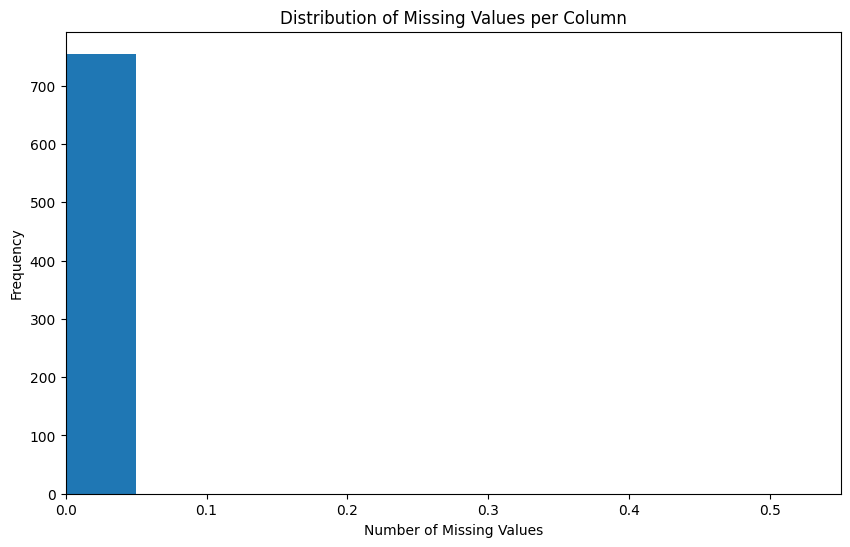

In [11]:
missing_values = speech.isnull().sum()

# Calculate percentage of missing values
missing_percentage = (speech.isnull().sum() / len(speech)) * 100

# Create a new DataFrame with the results
missing_data = pd.DataFrame({
    'Missing Values': missing_values,
    'Percentage Missing': missing_percentage
})

# Sort the DataFrame by percentage of missing values (descending order)
missing_data = missing_data.sort_values('Percentage Missing', ascending=False)

# Round the percentage to two decimal places
missing_data['Percentage Missing'] = missing_data['Percentage Missing'].round(2)

# Sort the DataFrame by percentage of missing values (descending order)
missing_data = missing_data.sort_values('Percentage Missing', ascending=False)

# Display the resulting DataFrame for only columns with missing values
display(missing_data[missing_data['Missing Values'] != 0])

plot_missing_values_distribution(speech)

#### per test detection (rows)

,Missing Values,Percentage Missing


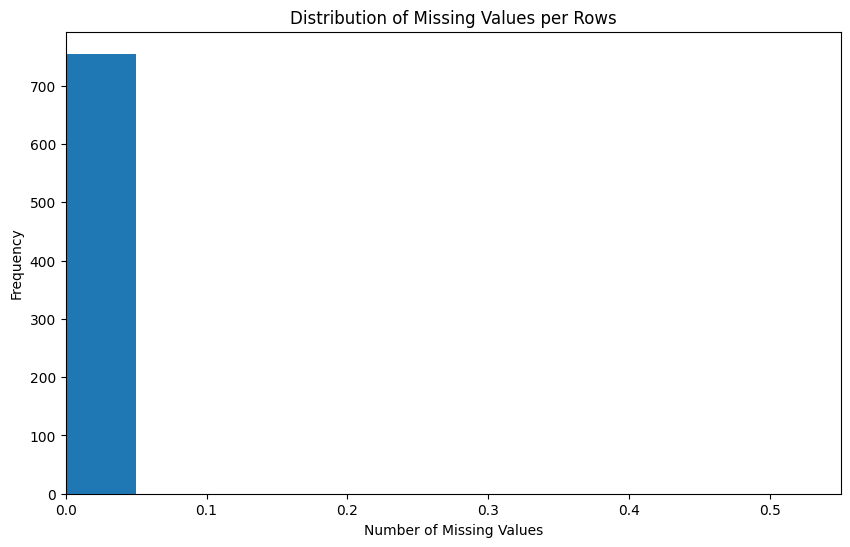

In [ ]:
# Calculate missing values per row
missing_values_per_row = speech.isnull().sum(axis=1)

# Calculate percentage of missing values per row
total_columns = len(speech.columns)
missing_percentage_per_row = (missing_values_per_row / total_columns) * 100

# Create a new DataFrame with the results
missing_data_per_row = pd.DataFrame({
    'Missing Values': missing_values_per_row,
    'Percentage Missing': missing_percentage_per_row
})

# Round the percentage to two decimal places
missing_data_per_row['Percentage Missing'] = missing_data_per_row['Percentage Missing'].round(2)

# Sort the DataFrame by percentage of missing values (descending order)
missing_data_per_row = missing_data_per_row.sort_values('Percentage Missing', ascending=False)

# Basic statistics of missing values per row
display(missing_data_per_row[missing_data_per_row['Missing Values'] != 0])

plot_missing_values_distribution(speech, 1)

#### look for disparities between different groups

Disparity in missing values between class:


C:\Users\bradn\AppData\Local\Temp\ipykernel_26160\4143320978.py:66: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



Feature set       feature                  
                  id                           0.0
TQWT Features     tqwt_medianValue_dec_6       0.0
                  tqwt_TKEO_std_dec_33         0.0
                  tqwt_TKEO_std_dec_34         0.0
                  tqwt_TKEO_std_dec_35         0.0
                                              ... 
Wavelet Features  det_LT_entropy_log_2_coef    0.0
                  det_LT_entropy_log_3_coef    0.0
                  det_LT_entropy_log_4_coef    0.0
                  det_LT_entropy_log_5_coef    0.0
                  class                        0.0
Name: 1, Length: 755, dtype: float64

C:\Users\bradn\AppData\Local\Temp\ipykernel_26160\4143320978.py:20: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



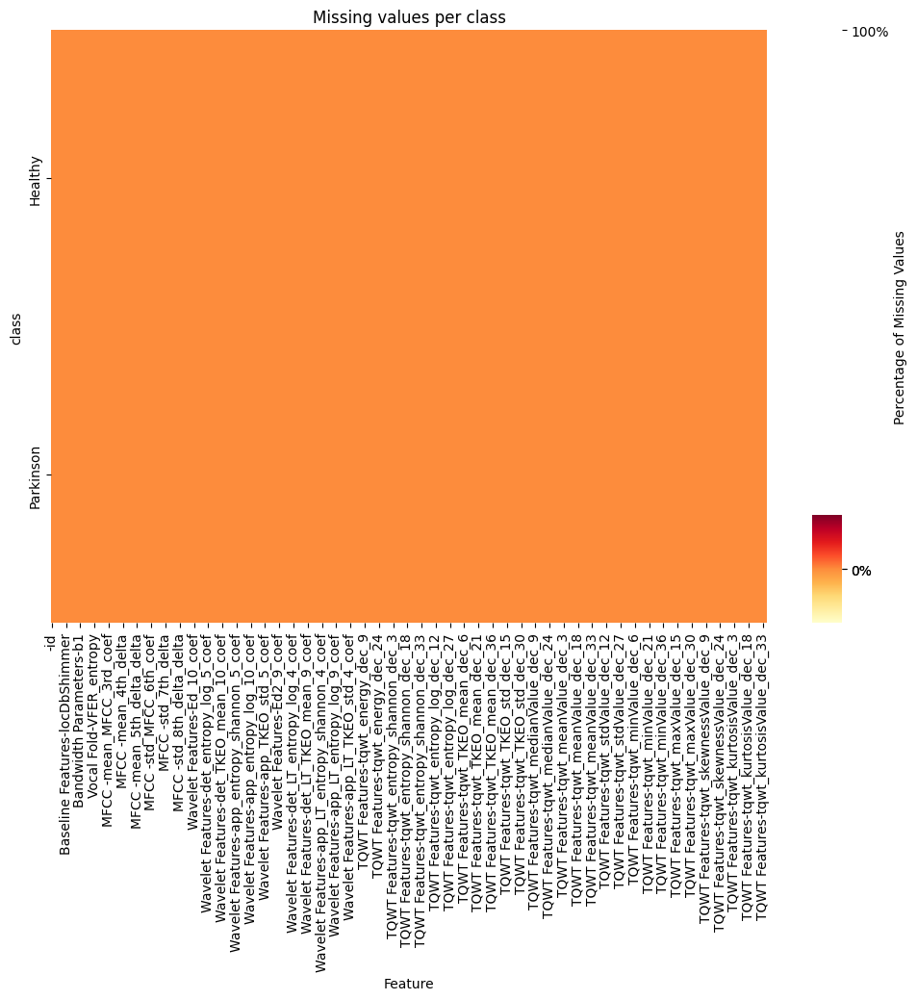

Disparity in missing values between gender:


C:\Users\bradn\AppData\Local\Temp\ipykernel_26160\4143320978.py:66: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



Feature set       feature                  
                  id                           0.0
TQWT Features     tqwt_medianValue_dec_6       0.0
                  tqwt_TKEO_std_dec_33         0.0
                  tqwt_TKEO_std_dec_34         0.0
                  tqwt_TKEO_std_dec_35         0.0
                                              ... 
Wavelet Features  det_LT_entropy_log_2_coef    0.0
                  det_LT_entropy_log_3_coef    0.0
                  det_LT_entropy_log_4_coef    0.0
                  det_LT_entropy_log_5_coef    0.0
                  class                        0.0
Name: 1, Length: 755, dtype: float64

C:\Users\bradn\AppData\Local\Temp\ipykernel_26160\4143320978.py:20: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



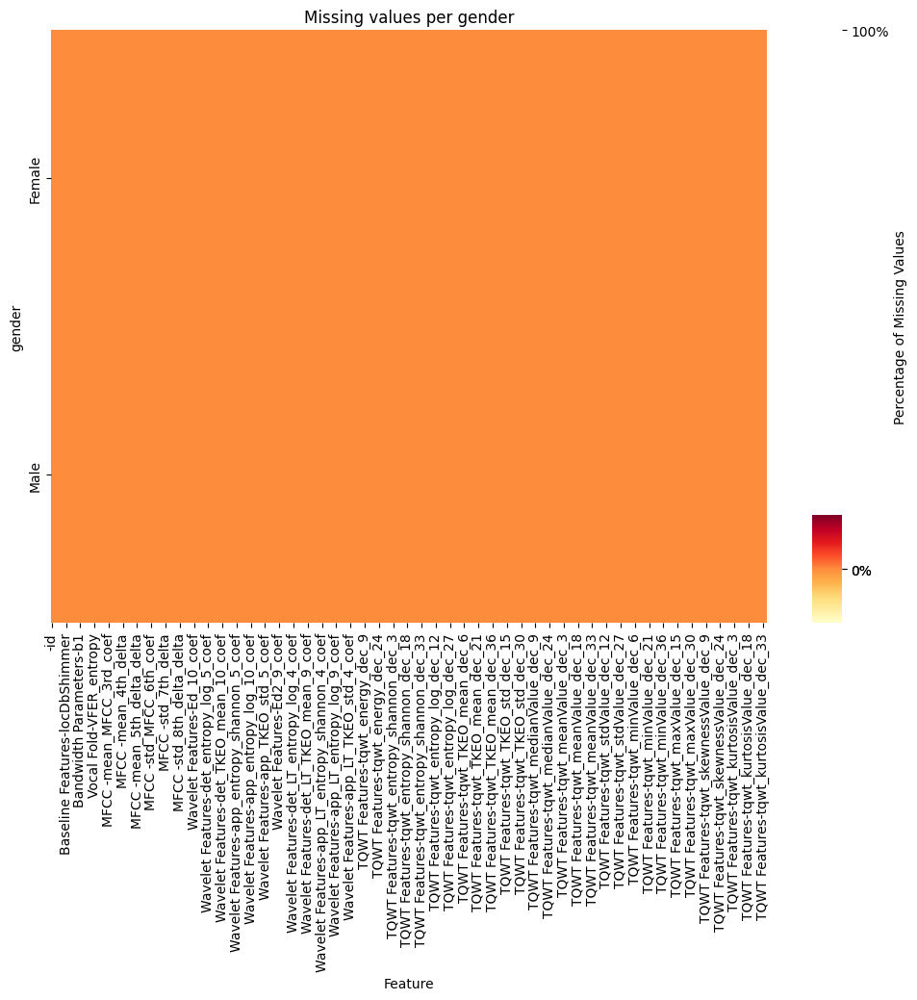

Disparity in missing values between id:


C:\Users\bradn\AppData\Local\Temp\ipykernel_26160\4143320978.py:66: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



Feature set       feature                  
                  id                           0.0
TQWT Features     tqwt_medianValue_dec_6       0.0
                  tqwt_TKEO_std_dec_33         0.0
                  tqwt_TKEO_std_dec_34         0.0
                  tqwt_TKEO_std_dec_35         0.0
                                              ... 
Wavelet Features  det_LT_entropy_log_2_coef    0.0
                  det_LT_entropy_log_3_coef    0.0
                  det_LT_entropy_log_4_coef    0.0
                  det_LT_entropy_log_5_coef    0.0
                  class                        0.0
Name: 251, Length: 755, dtype: float64

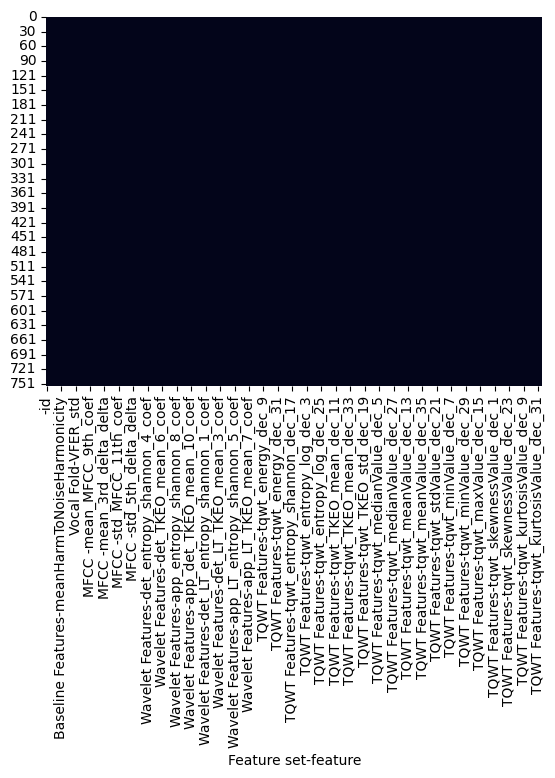

In [ ]:
analyze_missing_values_by_class(speech, ('','class'))
plot_missing_values_by_class(speech,('','class'), ['Healthy', 'Parkinson'])

analyze_missing_values_by_class(speech,('','gender'))
plot_missing_values_by_class(speech,('','gender'), ['Female', 'Male'])

analyze_missing_values_by_class(speech,('','id'))
# Visualize missing values using a heatmap
sns.heatmap(speech.isnull(), cbar=False)
plt.show()

In [14]:
msno.matrix(speech)
msno.bar(speech)

<Axes: ylabel='Feature set,feature'>

### Correction
drop columns and rows with too many missing values

In [ ]:
# Define the acceptable percentage of missing values per feature
ACCEPTABLE_PERCENTAGE_MISSING_PER_FEATURE = 30 # mentioned in the lecture but doesn't matter since no missing values

# Calculate the minimum count of non-missing values per row
min_count_per_feature = int((100 - ACCEPTABLE_PERCENTAGE_MISSING_PER_FEATURE) / 100 * speech.shape[0] + 1)

# Drop rows containing less than min_count_per_row non-missing values
speech.dropna(axis=1, thresh=min_count_per_feature)

Feature set             Baseline Features                              \
feature       id gender               PPE      DFA     RPDE numPulses   
0              0      1           0.85247  0.71826  0.57227       240   
1              0      1           0.76686  0.69481  0.53966       234   
2              0      1           0.85083  0.67604  0.58982       232   
3              1      0           0.41121  0.79672  0.59257       178   
4              1      0           0.32790  0.79782  0.53028       236   
..           ...    ...               ...      ...      ...       ...   
751          250      0           0.80903  0.56355  0.28385       417   
752          250      0           0.16084  0.56499  0.59194       415   
753          251      0           0.88389  0.72335  0.46815       381   
754          251      0           0.83782  0.74890  0.49823       340   
755          251      0           0.81304  0.76471  0.46374       340   

Feature set                                                                    \
feature     numPeriodsPulses meanPeriodPulses stdDevPeriodPulses locPctJitter   
0                        239         0.008064           0.000087      0.00218   
1                        233         0.008258           0.000073      0.00195   
2                        231         0.008340           0.000060      0.00176   
3                        177         0.010858           0.000183      0.00419   
4                        235         0.008162           0.002669      0.00535   
..                       ...              ...                ...          ...   
751                      416         0.004627           0.000052      0.00064   
752                      413         0.004550           0.000220      0.00143   
753                      380         0.005069           0.000103      0.00076   
754                      339         0.005679           0.000055      0.00092   
755                      339         0.005676           0.000037      0.00078   

Feature set  ...             TQWT Features                            \
feature      ... tqwt_kurtosisValue_dec_28 tqwt_kurtosisValue_dec_29   
0            ...                    1.5620                    2.6445   
1            ...                    1.5589                    3.6107   
2            ...                    1.5643                    2.3308   
3            ...                    3.7805                    3.5664   
4            ...                    6.1727                    5.8416   
..           ...                       ...                       ...   
751          ...                    3.0706                    3.0190   
752          ...                    1.9704                    1.7451   
753          ...                   51.5607                   44.4641   
754          ...                   19.1607                   12.8312   
755          ...                   62.9927                   21.8152   

Feature set                                                      \
feature     tqwt_kurtosisValue_dec_30 tqwt_kurtosisValue_dec_31   
0                              3.8686                    4.2105   
1                             23.5155                   14.1962   
2                              9.4959                   10.7458   
3                              5.2558                   14.0403   
4                              6.0805                    5.7621   
..                                ...                       ...   
751                            3.1212                    2.4921   
752                            1.8277                    2.4976   
753                           26.1586                    6.3076   
754                            8.9434                    2.2044   
755                            9.2457                    4.8555   

Feature set                                                      \
feature     tqwt_kurtosisValue_dec_32 tqwt_kurtosisValue_dec_33   
0                              5.1221                

In [ ]:
# Define the acceptable percentage of missing values per row
ACCEPTABLE_PERCENTAGE_MISSING_PER_ROW = 30  # mentioned in the lecture but doesn't matter since no missing values

# Calculate the minimum count of non-missing values per row
min_count_per_row = int((100 - ACCEPTABLE_PERCENTAGE_MISSING_PER_ROW) / 100 * speech.shape[1] + 1)

# Drop rows containing less than min_count_per_row non-missing values
speech.dropna(axis=0, thresh=min_count_per_row)

Feature set             Baseline Features                              \
feature       id gender               PPE      DFA     RPDE numPulses   
0              0      1           0.85247  0.71826  0.57227       240   
1              0      1           0.76686  0.69481  0.53966       234   
2              0      1           0.85083  0.67604  0.58982       232   
3              1      0           0.41121  0.79672  0.59257       178   
4              1      0           0.32790  0.79782  0.53028       236   
..           ...    ...               ...      ...      ...       ...   
751          250      0           0.80903  0.56355  0.28385       417   
752          250      0           0.16084  0.56499  0.59194       415   
753          251      0           0.88389  0.72335  0.46815       381   
754          251      0           0.83782  0.74890  0.49823       340   
755          251      0           0.81304  0.76471  0.46374       340   

Feature set                                                                    \
feature     numPeriodsPulses meanPeriodPulses stdDevPeriodPulses locPctJitter   
0                        239         0.008064           0.000087      0.00218   
1                        233         0.008258           0.000073      0.00195   
2                        231         0.008340           0.000060      0.00176   
3                        177         0.010858           0.000183      0.00419   
4                        235         0.008162           0.002669      0.00535   
..                       ...              ...                ...          ...   
751                      416         0.004627           0.000052      0.00064   
752                      413         0.004550           0.000220      0.00143   
753                      380         0.005069           0.000103      0.00076   
754                      339         0.005679           0.000055      0.00092   
755                      339         0.005676           0.000037      0.00078   

Feature set  ...             TQWT Features                            \
feature      ... tqwt_kurtosisValue_dec_28 tqwt_kurtosisValue_dec_29   
0            ...                    1.5620                    2.6445   
1            ...                    1.5589                    3.6107   
2            ...                    1.5643                    2.3308   
3            ...                    3.7805                    3.5664   
4            ...                    6.1727                    5.8416   
..           ...                       ...                       ...   
751          ...                    3.0706                    3.0190   
752          ...                    1.9704                    1.7451   
753          ...                   51.5607                   44.4641   
754          ...                   19.1607                   12.8312   
755          ...                   62.9927                   21.8152   

Feature set                                                      \
feature     tqwt_kurtosisValue_dec_30 tqwt_kurtosisValue_dec_31   
0                              3.8686                    4.2105   
1                             23.5155                   14.1962   
2                              9.4959                   10.7458   
3                              5.2558                   14.0403   
4                              6.0805                    5.7621   
..                                ...                       ...   
751                            3.1212                    2.4921   
752                            1.8277                    2.4976   
753                           26.1586                    6.3076   
754                            8.9434                    2.2044   
755                            9.2457                    4.8555   

Feature set                                                      \
feature     tqwt_kurtosisValue_dec_32 tqwt_kurtosisValue_dec_33   
0                              5.1221                

Impute  missing values

In [ ]:
def fill_missing_values(df: pd.DataFrame, columns: list[str], method:str='mean')->  pd.DataFrame:
    """
    Fills missing values in one or more specified columns of a DataFrame using the mean, median, or mode.
    
    Parameters:
    - df (pd.DataFrame): The input DataFrame.
    - columns (str or list): The column name or list of column names in which to fill missing values.
    - method (str): The method to fill missing values: 'mean', 'median', or 'mode'. Default is 'mean'.
    
    Returns:
    - pd.DataFrame: A DataFrame with the missing values filled in the specified column(s).
    """
    # Ensure that 'columns' is a list even if a single column is provided
    if isinstance(columns, str):
        columns = [columns]
    
    for column in columns:
        if column not in df.columns:
            raise ValueError(f"Column '{column}' does not exist in the DataFrame.")
        
        # Determine the fill value based on the chosen method
        if method == 'mean':
            fill_value = df[column].mean()
        elif method == 'median':
            fill_value = df[column].median()
        elif method == 'mode':
            mode_series = df[column].mode()
            if not mode_series.empty:
                fill_value = mode_series[0]  # Choose the first mode if multiple modes exist
            else:
                raise ValueError(f"Column '{column}' has no mode (all values are missing or unique).")
        else:
            raise ValueError(f"Invalid method '{method}'. Choose 'mean', 'median', or 'mode'.")
        
        # Fill the missing values in the current column with the calculated value
        df[column].fillna(fill_value, inplace=True)
    
    return df

In [15]:
# there are no missing values so this step is skipped

## Mean and normalise the 3 tests per person

In [16]:
# Group the 'speech' DataFrame by 'id' and calculate the mean of each group
# Reset the index to make 'id' a column again
speech_mean = speech.groupby(('', 'id')).mean().reset_index()

# Set the 'id' column as the index and name it 'ID' for easier access
speech_mean.set_index(('', 'id'), inplace=True)
speech_mean.index.name = 'ID'

# Define a function to check if a column contains only 0 and 1
def check_binary_column(column, column_name):
    unique_values = column.unique()
    if set(unique_values).issubset({0, 1}):
        print(f"{column_name} contains only 0 and 1.")
    else:
        raise ValueError(f"Error: {column_name} contains values other than 0 and 1: {unique_values}")

# Check if the 'class' column contains only 0 and 1
check_binary_column(speech_mean[('', 'class')], 'class')

# Check if the 'gender' column contains only 0 and 1
check_binary_column(speech_mean[('', 'gender')], 'gender')

class contains only 0 and 1.
gender contains only 0 and 1.


## Outliers
### detection

In [18]:
def compute_proximity_matrix(forest, X):
    n_samples = X.shape[0]
    proximity_matrix = np.zeros((n_samples, n_samples))
    
    for tree in forest.estimators_:
        leaves_index = tree.apply(X)
        for i in range(n_samples):
            for j in range(i, n_samples):
                if leaves_index[i] == leaves_index[j]:
                    proximity_matrix[i, j] += 1
                    proximity_matrix[j, i] += 1
    
    return proximity_matrix / len(forest.estimators_)

### Isolation Forest

C:\Users\bradn\AppData\Local\Temp\ipykernel_12828\3683810482.py:31: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



,PC1,PC2,PC3,Anomaly,score,Anomaly_threshold,class
0,11.583208,-6.652805,-4.578034,False,0.364468,False,1.0
1,7.587997,11.247738,19.730932,True,0.456858,True,1.0
2,-4.961150,-5.717944,4.181878,False,0.358816,False,1.0
3,-10.959030,6.318012,-10.463553,False,0.370157,False,1.0
4,0.481874,11.378341,-13.632024,False,0.389741,False,1.0
...,...,...,...,...,...,...,...
247,2.655423,-1.039893,-5.998117,False,0.346410,False,1.0
248,1.127335,4.678742,-0.551878,False,0.375022,False,1.0
249,-3.711758,-6.656445,1.759028,False,0.365404,False,1.0
250,-16.687440,0.727743,2.994118,False,0.409777,False,0.0


,PC1,PC2,PC3,Anomaly,score,Anomaly_threshold,class
1,7.587997,11.247738,19.730932,True,0.456858,True,1.0
7,3.204873,-4.862434,19.187420,False,0.450015,True,1.0
10,21.039792,15.345615,-2.357438,False,0.456376,True,1.0
16,-1.317107,18.495249,11.961474,False,0.444971,True,1.0
24,-8.392169,1.295854,15.637712,False,0.434435,True,0.0
41,-25.946155,9.537509,-10.768648,False,0.440803,True,0.0
48,-21.313971,9.336385,-12.365548,False,0.454759,True,0.0
77,0.738626,13.498902,16.046966,True,0.462504,True,1.0
81,10.306523,9.478221,10.482051,True,0.491372,True,1.0
87,1.761358,4.715277,26.799946,True,0.469241,True,1.0


26


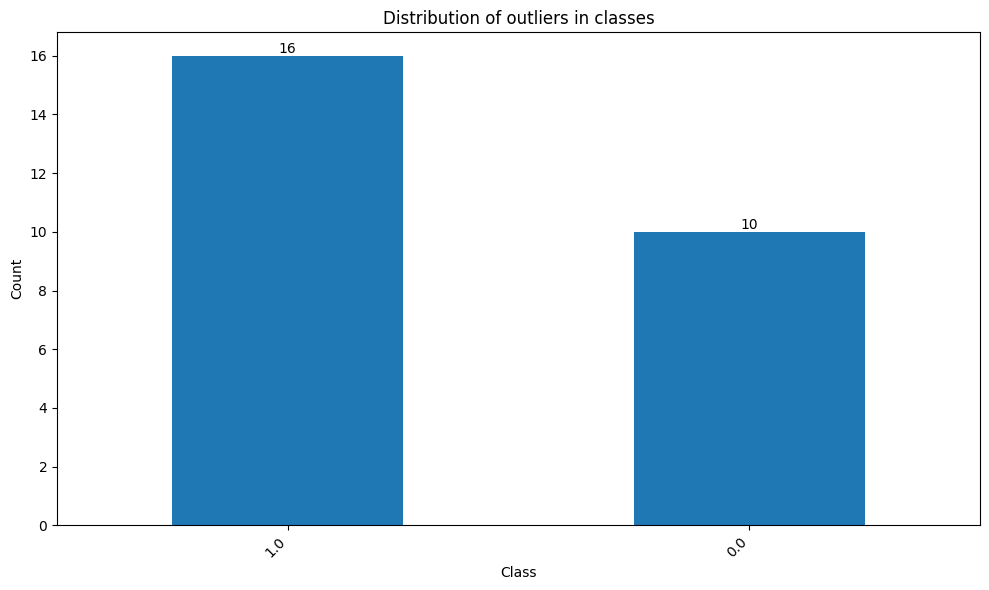

<Figure size 640x480 with 0 Axes>

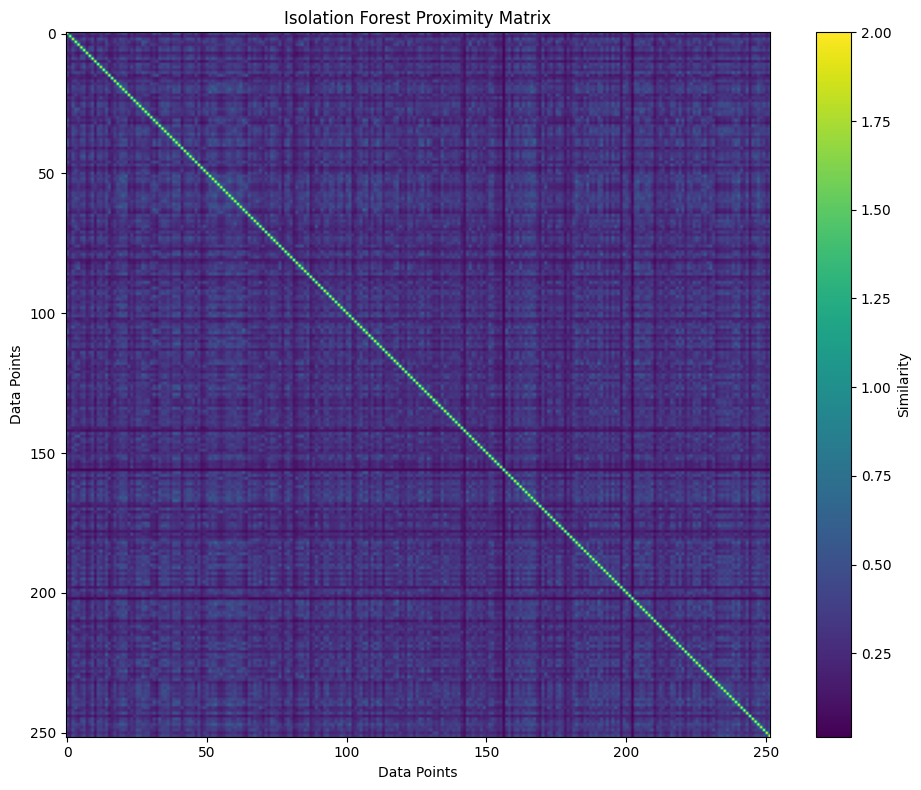

In [24]:
# Step 1: Create and configure the Isolation Forest model
# - n_estimators: Number of trees in the forest (set to 1000 for more robust results)
# - contamination: Expected proportion of outliers (set to 5%) (picked after looking at multiple percantages)
# - random_state: Ensures reproducibility of results
# - n_jobs: Uses all available processors (-1) for parallel processing
iso_forest = IsolationForest(n_estimators=1000, contamination=0.05, random_state=42, n_jobs=-1)

# Step 2: Fit the Isolation Forest model to the dataset (speech_mean)
# This will train the model and learn the "normal" and "anomalous" patterns in the data
iso_forest.fit(speech_mean)

# Step 3: Predict outliers using the Isolation Forest
# The model returns -1 for outliers and 1 for inliers (normal points)
outlier_labels = iso_forest.predict(speech_mean)

# Step 4: Perform PCA (Principal Component Analysis) to reduce the data to 3 components
# The PCA is applied on the scaled version of the data (scaled_data) to reduce its dimensionality
pca = PCA(n_components=3)
sc = StandardScaler()
scaled_data = sc.fit_transform(speech_mean[feature_columns])
pca_result = pca.fit_transform(scaled_data)
percantage_explained = pca.explained_variance_ratio_

# Step 5: Create a new DataFrame for the PCA results with 3 principal components
# Each row represents a data point in the new 3D PCA-transformed space
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2', 'PC3'])

# Add the 'Anomaly' column to the PCA DataFrame from the Isolation Forest predictions
# This allows us to see which points are outliers in the reduced PCA space
pca_df['Anomaly'] = outlier_labels
pca_df['Anomaly'] = pca_df['Anomaly'].replace([-1, 1], [True, False])
# The anomaly score of the input samples. The lower, the more abnormal, so to make it like explained in lecture we take the absolute value to make it so the higher the score the more abnormal
pca_df['score'] = abs(iso_forest.score_samples(speech_mean))
maximum_iso_score = 0.430
pca_df['Anomaly_threshold'] = pca_df['score'] > maximum_iso_score

# Also, add the 'class' column from the scaled_speech DataFrame to help visualize class information
pca_df['class'] = speech_mean[('', 'class')]


display(pca_df)
display(pca_df[pca_df['Anomaly_threshold']==True])
print(len(pca_df[pca_df['Anomaly_threshold']==True]))


# Step 6: Visualize the PCA result in 3D using Plotly
# - Color the points based on their anomaly status (outlier vs inlier)
# - Use different symbols for different classes in the dataset
fig = px.scatter_3d(
    pca_df, x='PC1', y='PC2', z='PC3', 
    color=pca_df['score'],  # Color points based on anomaly status (-1 for outliers, 1 for inliers)
    title="3D PCA with Isolation Forest scores",
    labels={
        'PC1': f'PC1 ({percantage_explained[0]*100:.2f}%)',
        'PC2': f'PC2 ({percantage_explained[1]*100:.2f}%)',
        'PC3': f'PC3 ({percantage_explained[2]*100:.2f}%)'
    },
    symbol = 'class'
)
# Update marker properties
fig.update_traces(marker=dict(size=5,
                              line=dict(width=2)),
                  selector=dict(mode='markers'))
# Display the 3D scatter plot
fig.show()
fig.write_image("images/PCA outliers absolute scores.png")



fig = px.scatter_3d(
    pca_df, x='PC1', y='PC2', z='PC3', 
    color=pca_df['Anomaly_threshold'],
    title=f"3D PCA with outliers absolute score > {maximum_iso_score}",
    labels={
        'PC1': f'PC1 ({percantage_explained[0]*100:.2f}%)',
        'PC2': f'PC2 ({percantage_explained[1]*100:.2f}%)',
        'PC3': f'PC3 ({percantage_explained[2]*100:.2f}%)'
    },
    symbol = 'class'
)
# Update marker properties
fig.update_traces(marker=dict(size=5,
                              line=dict(width=2)),
                  selector=dict(mode='markers'))
# Display the 3D scatter plot
fig.show()

fig = px.scatter(
    pca_df, x='PC1', y='PC2', 
    color=pca_df['score'],  # Color points based on anomaly status (-1 for outliers, 1 for inliers)
    title="3D PCA with Isolation Forest absolute scores",
    symbol=pca_df['class'],  # Use different symbols for different classes
    labels={
        'PC1': f'PC1 ({percantage_explained[0]*100:.2f}%)',
        'PC2': f'PC2 ({percantage_explained[1]*100:.2f}%)'
    },
)

fig.show()

# Count the occurrences of each unique value
value_counts = pca_df[pca_df['Anomaly_threshold']==True]['class'].value_counts()

# Create a bar plot
ax = value_counts.plot(kind='bar', figsize=(10, 6))

# Customize the plot
plt.title('Distribution of outliers in classes')
plt.xlabel('Class')
plt.ylabel('Count')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Add value labels on top of each bar
for i, v in enumerate(value_counts):
    ax.text(i, v, str(v), ha='center', va='bottom')

# Adjust layout to prevent cutting off labels
plt.tight_layout()

# Show the plot
plt.show()
plt.savefig('images/outlier barplot.png')


proximity_matrix = compute_proximity_matrix(iso_forest, speech_mean)
plt.figure(figsize=(10, 8))
plt.imshow(proximity_matrix, cmap='viridis')
plt.colorbar(label='Similarity')
plt.title('Isolation Forest Proximity Matrix')
plt.xlabel('Data Points')
plt.ylabel('Data Points')
plt.tight_layout()
plt.show()

### Correction

In [25]:
def correct_outliers(df, columns, outlier_column, method='mean'):
    """
    Correct outliers in specified columns based on a boolean outlier indicator column.
    
    Parameters:
    df (pd.DataFrame): Input DataFrame
    columns (list): List of column names to correct
    outlier_column (str): Name of the boolean column indicating outliers (True for outliers)
    method (str): Method to use for correction ('mean', 'median', 'mode', or 'winsorize')
    
    Returns:
    pd.DataFrame: DataFrame with corrected outliers
    """
    df_corrected = df.copy()
    
    for column in columns:
        if method == 'mean':
            # Replace outliers with mean of non-outlier values
            mean_value = df_corrected.loc[~df_corrected[outlier_column], column].mean()
            df_corrected.loc[df_corrected[outlier_column], column] = mean_value
        
        elif method == 'median':
            # Replace outliers with median of non-outlier values
            median_value = df_corrected.loc[~df_corrected[outlier_column], column].median()
            df_corrected.loc[df_corrected[outlier_column], column] = median_value
        
        elif method == 'mode':
            # Replace outliers with mode of non-outlier values
            mode_value = df_corrected.loc[~df_corrected[outlier_column], column].mode().iloc[0]
            df_corrected.loc[df_corrected[outlier_column], column] = mode_value
        
        elif method == 'winsorize':
            # Winsorize outliers to the nearest non-outlier value
            sorted_values = df_corrected.loc[~df_corrected[outlier_column], column].sort_values()
            lower_bound = sorted_values.iloc[5]
            upper_bound = sorted_values.iloc[-5]
            df_corrected.loc[df_corrected[outlier_column], column] = df_corrected.loc[df_corrected[outlier_column], column].clip(lower_bound, upper_bound)
        
        else:
            raise ValueError("Invalid method. Choose 'mean', 'median', 'mode', or 'winsorize'.")
    
    return df_corrected

# Example usage:
# Assuming 'df' is your DataFrame, 'numeric_columns' is a list of columns to correct,
# and 'is_outlier' is your boolean column indicating outliers

# df_corrected = correct_outliers(df, numeric_columns, outlier_column='is_outlier', method='mean')

In [27]:
speech_mean['Outliers'] = pca_df['Anomaly_threshold']
speech_corrected = correct_outliers(speech_mean, feature_columns, 'Outliers', method='winsorize')
speech_corrected = speech_corrected.drop([('Outliers','')],axis=1)

corrected_array = np.array(speech_corrected[feature_columns])
corrected_array = sc.transform(corrected_array)
pca_corrected_result = pca.transform(corrected_array)
pca_corrected_df = pd.DataFrame(data=pca_corrected_result, columns=['PC1', 'PC2', 'PC3'])

percantage_explained = pca.explained_variance_ratio_

fig = px.scatter_3d(
    pca_corrected_df, x='PC1', y='PC2', z='PC3', 
    color=pca_df['Anomaly_threshold'], 
    title="3D PCA with Isolation Forest Anomalies corrected",
    labels={
        'PC1': f'PC1 ({percantage_explained[0]*100:.2f}%)',
        'PC2': f'PC2 ({percantage_explained[1]*100:.2f}%)',
        'PC3': f'PC3 ({percantage_explained[2]*100:.2f}%)'
    },
)
# Update marker properties
fig.update_traces(marker=dict(size=5,
                              line=dict(width=2)),
                  selector=dict(mode='markers'))
# Display the 3D scatter plot
fig.show()
fig.write_image("images/PCA outliers corrected.png")

In [34]:
display(speech_corrected)
# Get the current column labels
columns = speech_corrected.columns.to_list()
columns[0] = ('Info', columns[0][1])
columns[-1] = ('Info', columns[-1][1])

# Set the new column labels
speech_corrected.columns = pd.MultiIndex.from_tuples(columns)

display(speech_corrected)
speech_corrected.to_csv('outliercorrected_pd_speech_features.csv')

Feature set        Baseline Features                                  \
feature     gender               PPE       DFA      RPDE   numPulses   
ID                                                                     
0              1.0          0.823387  0.696370  0.567250  235.333333   
1              0.0          0.422263  0.793993  0.592453  213.333333   
2              1.0          0.801973  0.619967  0.520563  319.333333   
3              0.0          0.828707  0.626097  0.537183  493.000000   
4              0.0          0.831287  0.779397  0.726717  362.666667   
..             ...               ...       ...       ...         ...   
247            0.0          0.751703  0.651830  0.586847  326.000000   
248            1.0          0.611750  0.688327  0.452343  356.666667   
249            1.0          0.819857  0.788800  0.373520  339.666667   
250            0.0          0.600530  0.569010  0.411987  402.333333   
251            0.0          0.844917  0.745653  0.476707  353.666667   

Feature set                                                                    \
feature     numPeriodsPulses meanPeriodPulses stdDevPeriodPulses locPctJitter   
ID                                                                              
0                 234.333333         0.008220           0.000073     0.001963   
1                 211.000000         0.008884           0.001849     0.005790   
2                 318.333333         0.006041           0.000104     0.002217   
3                 492.000000         0.003913           0.000042     0.000757   
4                 361.666667         0.005622           0.002023     0.003593   
..                       ...              ...                ...          ...   
247               324.666667         0.005911           0.000251     0.003193   
248               355.333333         0.005410           0.000964     0.002467   
249               338.666667         0.005684           0.000042     0.000800   
250               401.000000         0.004775           0.000103     0.000983   
251               352.666667         0.005475           0.000065     0.000820   

Feature set               ...             TQWT Features  \
feature     locAbsJitter  ... tqwt_kurtosisValue_dec_28   
ID                        ...                             
0               0.000016  ...                  1.561733   
1               0.000050  ...                  4.918567   
2               0.000013  ...                 41.129400   
3               0.000003  ...                  1.677633   
4               0.000021  ...                  4.104600   
..                   ...  ...                       ...   
247             0.000019  ...                 19.298667   
248             0.000014  ...                  4.448533   
249             0.000005  ...                 90.482767   
250             0.000005  ...                  2.674667   
251             0.000005  ...                 44.571367   

Feature set                                                      \
feature     tqwt_kurtosisValue_dec_29 tqwt_kurtosisValue_dec_30   
ID                                                                
0                            2.862000                 12.293333   
1                            4.827133                  6.117633   
2                           31.201933                 14.584467   
3                            1.908400                  2.842167   
4                            4.285233                  2.953200   
..                                ...                       ...   
247                         15.072200                 13.479700   
248                          3.180933                  2.880233   
249                         65.641367                 29.098533   
250                          2.714200                  2.706000   
251                         26.370167                 14.782567   

Feature set                                                      \
feature     tqwt_kurtos

Info Baseline Features                                                   \
    gender               PPE       DFA      RPDE   numPulses numPeriodsPulses   
ID                                                                              
0      1.0          0.823387  0.696370  0.567250  235.333333       234.333333   
1      0.0          0.422263  0.793993  0.592453  213.333333       211.000000   
2      1.0          0.801973  0.619967  0.520563  319.333333       318.333333   
3      0.0          0.828707  0.626097  0.537183  493.000000       492.000000   
4      0.0          0.831287  0.779397  0.726717  362.666667       361.666667   
..     ...               ...       ...       ...         ...              ...   
247    0.0          0.751703  0.651830  0.586847  326.000000       324.666667   
248    1.0          0.611750  0.688327  0.452343  356.666667       355.333333   
249    1.0          0.819857  0.788800  0.373520  339.666667       338.666667   
250    0.0          0.600530  0.569010  0.411987  402.333333       401.000000   
251    0.0          0.844917  0.745653  0.476707  353.666667       352.666667   

                                                                   ...  \
    meanPeriodPulses stdDevPeriodPulses locPctJitter locAbsJitter  ...   
ID                                                                 ...   
0           0.008220           0.000073     0.001963     0.000016  ...   
1           0.008884           0.001849     0.005790     0.000050  ...   
2           0.006041           0.000104     0.002217     0.000013  ...   
3           0.003913           0.000042     0.000757     0.000003  ...   
4           0.005622           0.002023     0.003593     0.000021  ...   
..               ...                ...          ...          ...  ...   
247         0.005911           0.000251     0.003193     0.000019  ...   
248         0.005410           0.000964     0.002467     0.000014  ...   
249         0.005684           0.000042     0.000800     0.000005  ...   
250         0.004775           0.000103     0.000983     0.000005  ...   
251         0.005475           0.000065     0.000820     0.000005  ...   

                TQWT Features                            \
    tqwt_kurtosisValue_dec_28 tqwt_kurtosisValue_dec_29   
ID                                                        
0                    1.561733                  2.862000   
1                    4.918567                  4.827133   
2                   41.129400                 31.201933   
3                    1.677633                  1.908400   
4                    4.104600                  4.285233   
..                        ...                       ...   
247                 19.298667                 15.072200   
248                  4.448533                  3.180933   
249                 90.482767                 65.641367   
250                  2.674667                  2.714200   
251                 44.571367                 26.370167   

                                                         \
    tqwt_kurtosisValue_dec_30 tqwt_kurtosisValue_dec_31   
ID                                                        
0                   12.293333                  9.717500   
1                    6.117633                  8.599667   
2                   14.584467                  5.446800   
3                    2.842167                  3.493867   
4                    2.953200                  2.799933   
..                        ...                       ...   
247                 13.479700                 14.877933   
248                  2.880233                  2.805067   
249                 29.098533                  8.966500   
250                  2.706000                  2.637700   
251                 14.782567                  4.455833   

                                                         \
    tqwt_kurtosisValue_dec_32 tqwt_kurtosisValue_dec_33   
ID                                                        
0  